# Load the relabeled calsses, pcs and v_exp of the climo data

In [2]:
import xarray as xr
# import numpy as np

data_dir = 'D:/VScode/Last_deglaciation/climo_ana_data'
ds_sat = xr.open_dataset(data_dir + '/ds_GMM_climo_relabeled.nc')
ds_sat

<xarray.Dataset>
Dimensions:                (age: 65, lat: 96, lon: 144)
Coordinates:
  * lat                    (lat) float32 -90.0 -88.11 -86.21 ... 88.11 90.0
  * lon                    (lon) float32 0.0 2.5 5.0 7.5 ... 352.5 355.0 357.5
  * age                    (age) float32 1.11e+04 1.13e+04 ... 2.37e+04 2.39e+04
Data variables:
    sat                    (age, lat, lon) float32 ...
    sat_std                (age, lat, lon) float32 ...
    sat_centered           (age, lat, lon) float32 ...
    weight                 (lat) float32 ...
    sat_centered_weighted  (age, lat, lon) float32 ...
    class_label            (lat, lon) int64 ...
    class_relabeled        (lat, lon) int32 ...

# Load the weighted average from the ensemble data

In [3]:
# read the all_weighted_avg_curves
import pickle
with open('ens_ana_data/all_weighted_avg_curves_checked.pkl', 'rb') as f:
    all_weighted_avg_curves = pickle.load(f)

# Calcualte the bootstrap mean

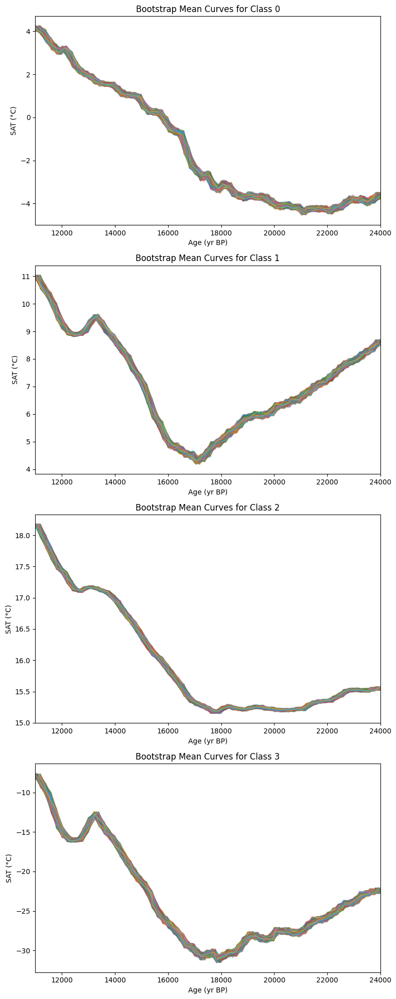

In [5]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np

# Set up the figure and GridSpec
fig = plt.figure(figsize=(8, 20))
gs = gridspec.GridSpec(4, 1, figure=fig)

# Parameters for bootstrap
n_iterations = 10000  # Number of bootstrap samples
n_samples = 500     # Number of curves to sample in each bootstrap iteration

# Dictionary to store the new ages and means for each class
stored_data = {}

# Plot each weighted_avg_curves[i]
for i in range(4):
    # Extract the i-th weighted average curve from each set in all_weighted_avg_curves, if it exists
    weighted_avg_curves_k = [curves[i] for curves in all_weighted_avg_curves if i in curves]
    
    ax = fig.add_subplot(gs[i, 0])

    # Convert list of numpy arrays to a 2D numpy array for easier manipulation
    curves_array = np.array(weighted_avg_curves_k)

    # Array to store the bootstrap means
    bootstrap_means = np.zeros((n_iterations, curves_array.shape[1]))
    # List to store new ages for each iteration
    new_ages_list = []

    # Perform bootstrap
    for j in range(n_iterations):
        # Sample with replacement from the curves
        indices = np.random.choice(len(weighted_avg_curves_k), n_samples, replace=True)
        sampled_curves = curves_array[indices]
        
        # Generate new ages randomly sampled from [age-100, age+100]
        new_ages = np.random.uniform(ds_sat['age'] - 100, ds_sat['age'] + 100)
        new_ages_list.append(new_ages)
        
        # Calculate the mean of the sampled curves
        bootstrap_means[j] = np.mean(sampled_curves, axis=0)
        
        # Plot the bootstrap mean curve with the new age
        ax.plot(new_ages, bootstrap_means[j], label=f'Bootstrap {j}', alpha=0.5)

    # Store new ages and means for each class
    stored_data[i] = {'new_ages': new_ages_list, 'bootstrap_means': bootstrap_means}

    ax.set_title(f'Bootstrap Mean Curves for Class {i}')
    ax.set_xlabel('Age (yr BP)')
    ax.set_ylabel('SAT (°C)')
    ax.set_xlim(np.min(ds_sat['age']) - 100, np.max(ds_sat['age']) + 100)

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()

# Optionally, print or return the stored data
print(stored_data)


In [32]:
# store the stored_data in /data_fig2 with name 'LGMR_bootstrap_mean_of_classes.pkl'
with open('ens_ana_data/LGMR_bootstrap_mean_of_classes.pkl', 'wb') as f:
    pickle.dump(stored_data, f)

In [4]:
# read the stored_data in /data_fig2 with name 'LGMR_bootstrap_mean_of_classes.pkl'
with open('ens_ana_data/LGMR_bootstrap_mean_of_classes.pkl', 'rb') as f:
    stored_data = pickle.load(f)

-Progress:100.0% done[==============================================================]
pospr_diff_max_index: 30
cps [15. 30. 37. 45.]
selected_cp_index: 1
\Progress:100.0% done[==============================================================]
pospr_diff_max_index: 13
cps [15. 25. 32. 36. 40.]
selected_cp_index: 0
|Progress:100.0% done[==============================================================]
pospr_diff_max_index: 13
cps [ 7. 14. 32. 36. 41.]
selected_cp_index: 1
/Progress:100.0% done[==============================================================]
pospr_diff_max_index: 13
cps [15. 32. 37. 45.]
selected_cp_index: 0
-Progress:100.0% done[==============================================================]
pospr_diff_max_index: 13
cps [15. 25. 32. 37. 45.]
selected_cp_index: 0
\Progress:100.0% done[==============================================================]
pospr_diff_max_index: 14
cps [15. 32. 37. 41. 45.]
selected_cp_index: 0
|Progress:100.0% done[======================================

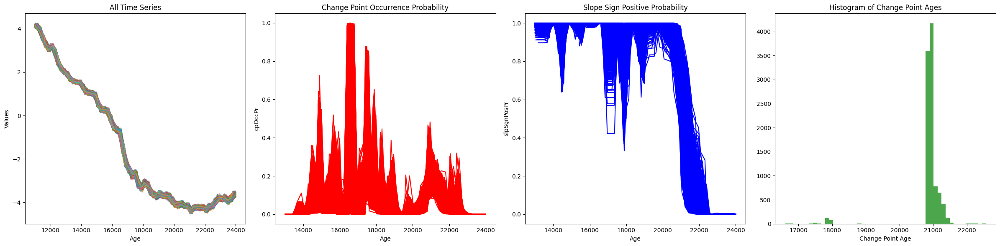

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from toolbox import change_point_functions as cpf

all_arrays = stored_data[0]['bootstrap_means']
new_ages = np.array(stored_data[0]['new_ages'])

# Initialize a list to store cp_age values
cp_ages_0 = []
cpOccPr_0=[]

# Creating a figure with 1 row and 4 columns to accommodate the new histogram plot
fig, ax = plt.subplots(1, 4, figsize=(24, 6))  # Increased width to better fit four subplots

# Loop through all arrays
for i, array in enumerate(all_arrays):
    # Calculate the cp_info for each dataset
    cp_info = cpf.find_cp(array, new_ages[i, :], rb_plot=False)
    
    # Extract data for plotting from cp_info
    data_flipped = cp_info['data_flipped']
    cpOccPr = cp_info['cpOccPr']
    slpSgnPosPr = cp_info['slpSgnPosPr']
    age = cp_info['age']
    cp_age = cp_info['cp_age']

    # Store cp_age in the list using append
    cp_ages_0.append(cp_age)  # Corrected to append for a single float value
    cpOccPr_0.append(cpOccPr)
    
    # Plot all arrays in the first subplot
    ax[0].plot(new_ages[i, :], array, alpha=0.5)  # using alpha for better visibility if lines overlap
    ax[1].plot(age, cpOccPr, 'r-')  # Red line for visibility
    ax[2].plot(age, slpSgnPosPr, 'b-')  # Blue line for visibility

# Adding labels and titles to the subplots
ax[0].set_title('All Time Series')
ax[0].set_xlabel('Age')
ax[0].set_ylabel('Values')

ax[1].set_title('Change Point Occurrence Probability')
ax[1].set_xlabel('Age')
ax[1].set_ylabel('cpOccPr')

ax[2].set_title('Slope Sign Positive Probability')
ax[2].set_xlabel('Age')
ax[2].set_ylabel('slpSgnPosPr')

# Plot the histogram of cp_age in the fourth subplot
ax[3].hist(cp_ages_0, bins=50, color='green', alpha=0.7)


ax[3].set_title('Histogram of Change Point Ages')
ax[3].set_xlabel('Change Point Age')
# ax_3.set_ylabel('Frequency')

# Display the plot
plt.tight_layout()
plt.show()


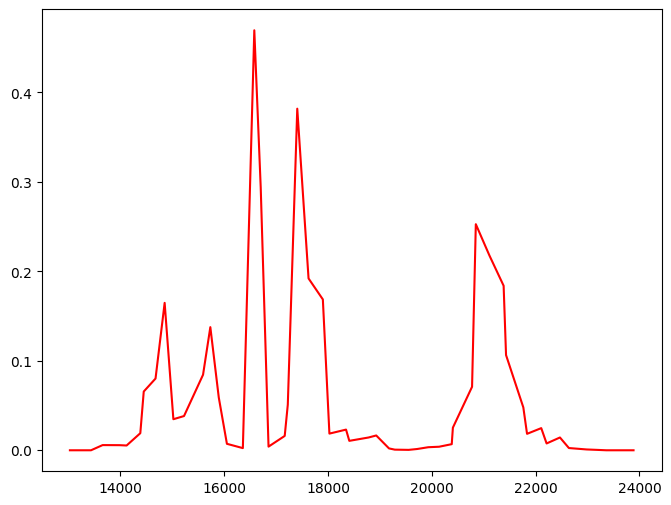

In [13]:
# calculate the median of the cpOccPr_0 and plot it
cpOccPr_0 = np.array(cpOccPr_0)
cpOccPr_0_median = np.median(cpOccPr_0, axis=0)

fig, ax = plt.subplots(1, 1, figsize=(8, 6))
ax.plot(age, cpOccPr_0_median, 'r-')


In [9]:
# save the cp_ages_0 under /data_fig2 with name 'cp_ages_0.pkl'
with open('data_fig2/cp_ages_0.pkl', 'wb') as f:
    pickle.dump(cp_ages_0, f)


In [15]:
# save the cpOccPr_0 under /data_fig2 with name 'cpOccPr_0.pkl'
with open('data_fig2/cpOccPr_0.pkl', 'wb') as f:
    pickle.dump(cpOccPr_0, f)

-Progress:100.0% done[==============================================================]
pospr_diff_max_index: 34
cps [17. 23. 35. 39. 48.]
selected_cp_index: 2
\Progress:100.0% done[==============================================================]
pospr_diff_max_index: 22
cps [15. 23. 33. 41. 48.]
selected_cp_index: 1
|Progress:100.0% done[==============================================================]
pospr_diff_max_index: 34
cps [15. 23. 35. 48.]
selected_cp_index: 2
/Progress:100.0% done[==============================================================]
pospr_diff_max_index: 34
cps [17. 23. 35. 39. 48.]
selected_cp_index: 2
-Progress:100.0% done[==============================================================]
pospr_diff_max_index: 34
cps [19. 23. 35. 40. 48.]
selected_cp_index: 2
\Progress:100.0% done[==============================================================]
pospr_diff_max_index: 34
cps [15. 23. 35. 40. 48.]
selected_cp_index: 2
|Progress:100.0% done[==================================

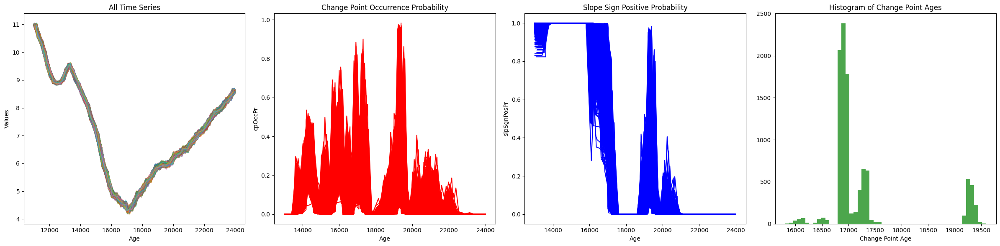

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from toolbox import change_point_functions as cpf

all_arrays = stored_data[1]['bootstrap_means']
new_ages = np.array(stored_data[1]['new_ages'])

# Initialize a list to store cp_age values
cp_ages_1 = []
cpOccPr_1=[]

# Creating a figure with 1 row and 4 columns to accommodate the new histogram plot
fig, ax = plt.subplots(1, 4, figsize=(24, 6))  # Increased width to better fit four subplots

# Loop through all arrays
for i, array in enumerate(all_arrays):
    # Calculate the cp_info for each dataset
    cp_info = cpf.find_cp(array, new_ages[i, :], rb_plot=False)
    
    # Extract data for plotting from cp_info
    data_flipped = cp_info['data_flipped']
    cpOccPr = cp_info['cpOccPr']
    slpSgnPosPr = cp_info['slpSgnPosPr']
    age = cp_info['age']
    cp_age = cp_info['cp_age']

    # Store cp_age in the list using append
    cp_ages_1.append(cp_age)  # Corrected to append for a single float value
    cpOccPr_1.append(cpOccPr)
    
    # Plot all arrays in the first subplot
    ax[0].plot(new_ages[i, :], array, alpha=0.5)  # using alpha for better visibility if lines overlap
    ax[1].plot(age, cpOccPr, 'r-')  # Red line for visibility
    ax[2].plot(age, slpSgnPosPr, 'b-')  # Blue line for visibility

# Adding labels and titles to the subplots
ax[0].set_title('All Time Series')
ax[0].set_xlabel('Age')
ax[0].set_ylabel('Values')

ax[1].set_title('Change Point Occurrence Probability')
ax[1].set_xlabel('Age')
ax[1].set_ylabel('cpOccPr')

ax[2].set_title('Slope Sign Positive Probability')
ax[2].set_xlabel('Age')
ax[2].set_ylabel('slpSgnPosPr')

# Plot the histogram of cp_age in the fourth subplot
ax[3].hist(cp_ages_1, bins=50, color='green', alpha=0.7)
ax[3].set_title('Histogram of Change Point Ages')
ax[3].set_xlabel('Change Point Age')
# ax_3.set_ylabel('Frequency')

# Display the plot
plt.tight_layout()
plt.show()


In [12]:
with open('data_fig2/cp_ages_1.pkl', 'wb') as f:
    pickle.dump(cp_ages_1, f)


In [7]:
# save the cpOccPr_0 under /data_fig2 with name 'cpOccPr_0.pkl'
with open('data_fig2/cpOccPr_1.pkl', 'wb') as f:
    pickle.dump(cpOccPr_1, f)

-Progress:100.0% done[==============================================================]
pospr_diff_max_index: 33
cps [ 7. 14. 30. 34. 51.]
selected_cp_index: 3
\Progress:100.0% done[==============================================================]
pospr_diff_max_index: 33
cps [ 7. 14. 30. 34. 51.]
selected_cp_index: 3
|Progress:100.0% done[==============================================================]
pospr_diff_max_index: 33
cps [ 7. 14. 30. 34. 51.]
selected_cp_index: 3
/Progress:100.0% done[==============================================================]
pospr_diff_max_index: 33
cps [ 7. 14. 34. 51.]
selected_cp_index: 2
-Progress:100.0% done[==============================================================]
pospr_diff_max_index: 33
cps [ 7. 14. 34. 51.]
selected_cp_index: 2
\Progress:100.0% done[==============================================================]
pospr_diff_max_index: 33
cps [ 7. 14. 30. 34. 51.]
selected_cp_index: 3
|Progress:100.0% done[======================================

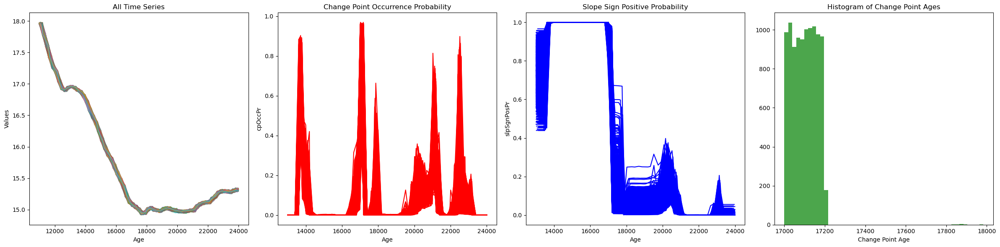

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from toolbox import change_point_functions as cpf

all_arrays = stored_data[2]['bootstrap_means']
new_ages = np.array(stored_data[2]['new_ages'])

# Initialize a list to store cp_age values
cp_ages_2 = []
cpOccPr_2=[]

# Creating a figure with 1 row and 4 columns to accommodate the new histogram plot
fig, ax = plt.subplots(1, 4, figsize=(24, 6))  # Increased width to better fit four subplots

# Loop through all arrays
for i, array in enumerate(all_arrays):
    # Calculate the cp_info for each dataset
    cp_info = cpf.find_cp(array, new_ages[i, :], rb_plot=False)
    
    # Extract data for plotting from cp_info
    data_flipped = cp_info['data_flipped']
    cpOccPr = cp_info['cpOccPr']
    slpSgnPosPr = cp_info['slpSgnPosPr']
    age = cp_info['age']
    cp_age = cp_info['cp_age']

    # Store cp_age in the list using append
    cp_ages_2.append(cp_age)  # Corrected to append for a single float value
    cpOccPr_2.append(cpOccPr)
    
    # Plot all arrays in the first subplot
    ax[0].plot(new_ages[i, :], array, alpha=0.5)  # using alpha for better visibility if lines overlap
    ax[1].plot(age, cpOccPr, 'r-')  # Red line for visibility
    ax[2].plot(age, slpSgnPosPr, 'b-')  # Blue line for visibility

# Adding labels and titles to the subplots
ax[0].set_title('All Time Series')
ax[0].set_xlabel('Age')
ax[0].set_ylabel('Values')

ax[1].set_title('Change Point Occurrence Probability')
ax[1].set_xlabel('Age')
ax[1].set_ylabel('cpOccPr')

ax[2].set_title('Slope Sign Positive Probability')
ax[2].set_xlabel('Age')
ax[2].set_ylabel('slpSgnPosPr')

# Plot the histogram of cp_age in the fourth subplot
ax[3].hist(cp_ages_2, bins=50, color='green', alpha=0.7)
ax[3].set_title('Histogram of Change Point Ages')
ax[3].set_xlabel('Change Point Age')
# ax_3.set_ylabel('Frequency')

# Display the plot
plt.tight_layout()
plt.show()


In [5]:
with open('data_fig2/cp_ages_2.pkl', 'wb') as f:
    pickle.dump(cp_ages_2, f)


-Progress:100.0% done[==============================================================]
pospr_diff_max_index: 34
cps [17. 26. 35. 43.]
selected_cp_index: 2
\Progress:100.0% done[==============================================================]
pospr_diff_max_index: 34
cps [17. 26. 35. 42.]
selected_cp_index: 2
|Progress:100.0% done[==============================================================]
pospr_diff_max_index: 34
cps [17. 27. 35. 42.]
selected_cp_index: 2
/Progress:100.0% done[==============================================================]
pospr_diff_max_index: 34
cps [16. 26. 36. 43. 50.]
selected_cp_index: 2
-Progress:100.0% done[==============================================================]
pospr_diff_max_index: 35
cps [14. 26. 36. 41.]
selected_cp_index: 2
\Progress:100.0% done[==============================================================]
pospr_diff_max_index: 34
cps [ 9. 16. 26. 34. 43.]
selected_cp_index: 3
|Progress:100.0% done[==============================================

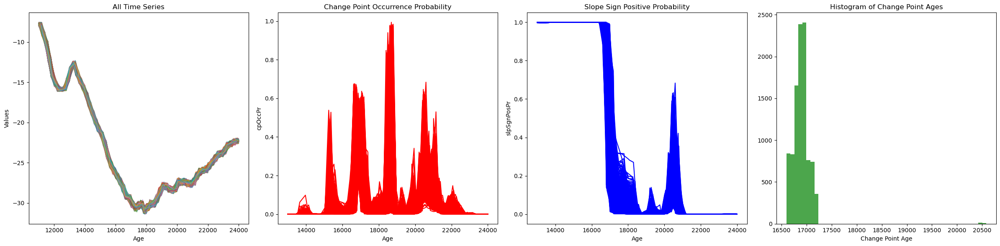

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from toolbox import change_point_functions as cpf

all_arrays = stored_data[3]['bootstrap_means']
new_ages = np.array(stored_data[3]['new_ages'])

# Initialize a list to store cp_age values
cp_ages_3 = []

# Creating a figure with 1 row and 4 columns to accommodate the new histogram plot
fig, ax = plt.subplots(1, 4, figsize=(24, 6))  # Increased width to better fit four subplots

# Loop through all arrays
for i, array in enumerate(all_arrays):
    # Calculate the cp_info for each dataset
    cp_info = cpf.find_cp(array, new_ages[i, :], rb_plot=False)
    
    # Extract data for plotting from cp_info
    data_flipped = cp_info['data_flipped']
    cpOccPr = cp_info['cpOccPr']
    slpSgnPosPr = cp_info['slpSgnPosPr']
    age = cp_info['age']
    cp_age = cp_info['cp_age']

    # Store cp_age in the list using append
    cp_ages_3.append(cp_age)  # Corrected to append for a single float value
    
    # Plot all arrays in the first subplot
    ax[0].plot(new_ages[i, :], array, alpha=0.5)  # using alpha for better visibility if lines overlap
    ax[1].plot(age, cpOccPr, 'r-')  # Red line for visibility
    ax[2].plot(age, slpSgnPosPr, 'b-')  # Blue line for visibility

# Adding labels and titles to the subplots
ax[0].set_title('All Time Series')
ax[0].set_xlabel('Age')
ax[0].set_ylabel('Values')

ax[1].set_title('Change Point Occurrence Probability')
ax[1].set_xlabel('Age')
ax[1].set_ylabel('cpOccPr')

ax[2].set_title('Slope Sign Positive Probability')
ax[2].set_xlabel('Age')
ax[2].set_ylabel('slpSgnPosPr')

# Plot the histogram of cp_age in the fourth subplot
ax[3].hist(cp_ages_3, bins=50, color='green', alpha=0.7)
ax[3].set_title('Histogram of Change Point Ages')
ax[3].set_xlabel('Change Point Age')
# ax_3.set_ylabel('Frequency')

# Display the plot
plt.tight_layout()
plt.show()


In [7]:
with open('data_fig2/cp_ages_3.pkl', 'wb') as f:
    pickle.dump(cp_ages_3, f)


# load change points

In [4]:
# load cp_ages_0, cp_ages_1, cp_ages_2, cp_ages_3
with open('data_fig2/cp_ages_0.pkl', 'rb') as f:
    cp_ages_0 = pickle.load(f)

with open('data_fig2/cp_ages_1.pkl', 'rb') as f:
    cp_ages_1 = pickle.load(f)

with open('data_fig2/cp_ages_2.pkl', 'rb') as f:
    cp_ages_2 = pickle.load(f)

with open('data_fig2/cp_ages_3.pkl', 'rb') as f:
    cp_ages_3 = pickle.load(f)

Class 0: Median = 20926, 5th Percentile = 20813, 95th Percentile = 21270
Class 1: Median = 16932, 5th Percentile = 16813, 95th Percentile = 17358
Class 2: Median = 17101, 5th Percentile = 17010, 95th Percentile = 17190
Class 3: Median = 16894, 5th Percentile = 16647, 95th Percentile = 17142


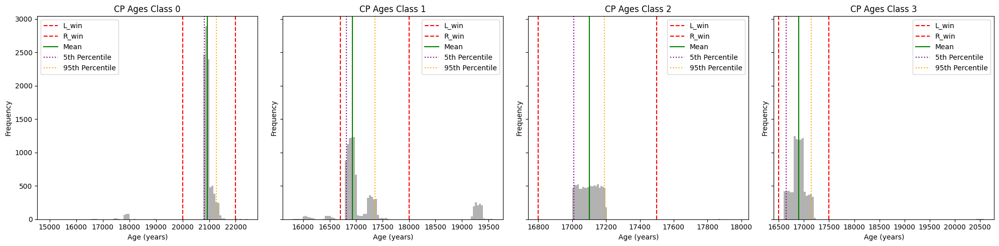

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pickle

# Assuming L_win and R_win are defined, for example:
L_win_all = [20000, 16700, 16800, 16500]
R_win_all = [22000, 18000, 17500, 17500]

# Load the data
cp_ages = []
for i in range(4):
    with open(f'data_fig2/cp_ages_{i}.pkl', 'rb') as f:
        cp_ages.append(pickle.load(f))

cp_age_statistics = {}

# Set up the figure and subplots
fig, axs = plt.subplots(1, 4, figsize=(20, 5), sharey=True)

for i, ax in enumerate(axs):
    # Plot histogram of the full data
    ax.hist(cp_ages[i], bins=100, color='gray', alpha=0.6)
    ax.set_title(f'CP Ages Class {i}')
    ax.set_xlabel('Age (years)')
    ax.set_ylabel('Frequency')

    L_win = L_win_all[i]
    R_win = R_win_all[i]
    # Cropping data between L_win and R_win
    cropped_ages = [age for age in cp_ages[i] if L_win <= age <= R_win]

    # cropped_ages = cp_ages[i]

    
    # Calculate mean, 5th and 95th percentiles
    mean_cp_age = np.median(cropped_ages)
    # mean_cp_age = np.mean(cropped_ages)
    percentile_5 = np.percentile(cropped_ages, 5)
    percentile_95 = np.percentile(cropped_ages, 95)

    # Store the statistics
    cp_age_statistics[i] = {
        'mean': mean_cp_age,
        '5th_percentile': percentile_5,
        '95th_percentile': percentile_95
    }


    # pring the mean, 5th and 95th percentiles of each class
    print(f'Class {i}: Median = {mean_cp_age:.0f}, 5th Percentile = {percentile_5:.0f}, 95th Percentile = {percentile_95:.0f}')

    # Plotting vertical lines for L_win, R_win, mean, 5th and 95th percentiles
    ax.axvline(x=L_win, color='red', linestyle='--', label='L_win')
    ax.axvline(x=R_win, color='red', linestyle='--', label='R_win')
    ax.axvline(x=mean_cp_age, color='green', linestyle='-', label='Mean')
    ax.axvline(x=percentile_5, color='purple', linestyle=':', label='5th Percentile')
    ax.axvline(x=percentile_95, color='orange', linestyle=':', label='95th Percentile')

    # Add a legend to each subplot
    ax.legend()

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()


In [1]:
import numpy as np

cp_age_bootstrap = np.array([20926, 16932, 17101, 16894])
cp_age_bootstrap_CI = np.array([
    [21270, 20813],
    [17358, 16813],
    [17190, 17010],
    [17142, 16647]
])


In [54]:
# store the cp_age_statistics
with open('data_fig2/cp_age_statistics.pkl', 'wb') as f:
    pickle.dump(cp_age_statistics, f)

# Load the relabeled calsses, pcs and v_exp of the climo data

In [9]:
import xarray as xr
# import numpy as np

data_dir = 'D:/VScode/Last_deglaciation/climo_ana_data'
ds_sat = xr.open_dataset(data_dir + '/ds_GMM_climo_relabeled.nc')


# Load the weighted average from the ensemble data

In [10]:
# read the all_weighted_avg_curves
import pickle
with open('ens_ana_data/all_weighted_avg_curves_checked.pkl', 'rb') as f:
    all_weighted_avg_curves = pickle.load(f)

# Load TraCE data

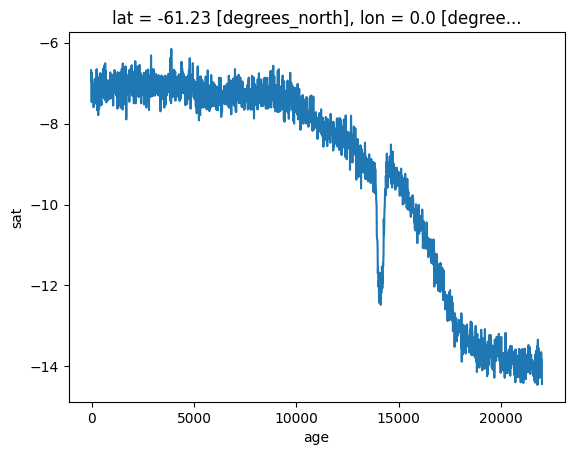

In [11]:
import xarray as xr

# import .nc data
ds = xr.open_dataset('TraCE_data/trace.01-36.22000BP.cam2.TREFHT.22000BP_decavg_400BCE.nc')

# rename the TREFHT to sat
ds = ds.rename({'TREFHT': 'sat'})
# rename the time to age
ds = ds.rename({'time': 'age'})
# multiply age by 1000
ds['age'] = ds['age'] * -1000

# convert the sat to degrees C
ds['sat'] = ds['sat'] - 273.15

ds = ds[['sat']]

ds_trace=ds

ds_trace['sat'].isel(lat=7, lon=0).plot()


In [12]:
# read the TraCE_weighted_avg_LGMR_mask.pkl
import pickle
with open('data_fig2/TraCE_weighted_avg_LGMR_mask.pkl', 'rb') as f:
    TraCE_weighted_avg_LGMR_mask = pickle.load(f)

In [13]:
# load the cp_age_statistics
with open('data_fig2/cp_age_statistics.pkl', 'rb') as f:
    cp_age_statistics = pickle.load(f)

# Plot

-Progress:100.0% done[==============================================================]
pospr_diff_max_index: 13
cps [15. 32. 37. 45.]
selected_cp_index: 0
\Progress:100.0% done[==============================================================]
pospr_diff_max_index: 34
cps [15. 23. 35. 40. 48.]
selected_cp_index: 2
|Progress:100.0% done[==============================================================]
pospr_diff_max_index: 33
cps [ 7. 14. 30. 34. 51.]
selected_cp_index: 3
/Progress:100.0% done[==============================================================]
pospr_diff_max_index: 34
cps [17. 26. 35. 43.]
selected_cp_index: 2


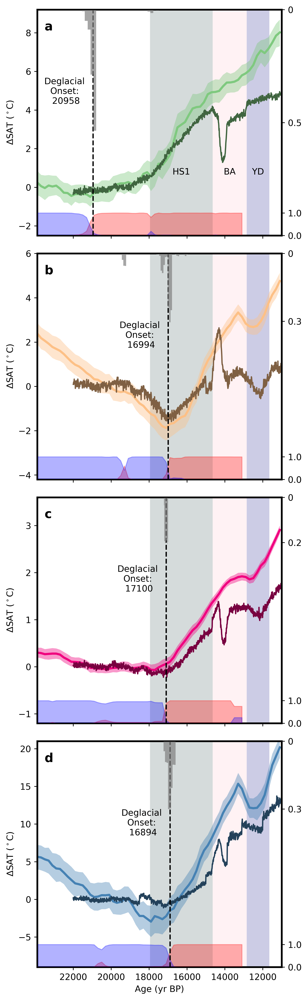

In [15]:
import importlib
import numpy as np
import matplotlib.pyplot as plt
from toolbox import change_point_functions as cpf
importlib.reload(cpf)
from matplotlib.colors import ListedColormap



# Create a figure with 4 rows and 1 column
fig, axs = plt.subplots(4, 1, figsize=(5, 16),dpi=600,sharex=True)
# cmap = plt.get_cmap('Accent', 4)

if len(all_weighted_avg_curves[0]) <= 4:
    custom_colors = [
    (0.4980392156862745, 0.788235294117647, 0.4980392156862745),
    (0.9921568627450981, 0.7529411764705882, 0.5254901960784314),
    (0.9411764705882353, 0.00784313725490196, 0.4980392156862745),
    (0.27450980392156865, 0.5098039215686274, 0.7058823529411765),]

    # Create a ListedColormap object with your custom colors
    cmap = ListedColormap(custom_colors)   
else:
    cmap = plt.get_cmap('Accent', len(all_weighted_avg_curves[0]))


custom_colors_1=[(0.24901960784313726, 0.3941176470588235, 0.24901960784313726),
 (0.49607843137254903, 0.3764705882352941, 0.2627450980392157),
 (0.47058823529411764, 0.00392156862745098, 0.24901960784313726),
 (0.13725490196078433, 0.2549019607843137, 0.35294117647058826)]

# Create a ListedColormap object with your custom colors
cmap1 = ListedColormap(custom_colors_1)


# Add climate transitions timing
HS1 = np.array([18000, 14692]) - 50  # convert to b1950
BA = np.array([14692, 12896]) - 50
YD = np.array([12896, 11703]) - 50

ylims=[[-2.5,9.2],[-4.2,6],[-1.2,3.6],[-9,21]]

# Loop through the range 0 to 3
for i in range(4):

    
    # Get the current axis
    ax1 = axs[i]


    weighted_avg_curves_k = [curves[i] for curves in all_weighted_avg_curves if i in curves]

    
    # loop through each data in weighted_avg_curves_k and calculate the mean between index 35 to 54 (correpsonding to 18100 to 21000 BP)
    for j in range(len(weighted_avg_curves_k)):
        data=weighted_avg_curves_k[j]
        data_18100_21000=np.mean(data[35:55])
        data=data-data_18100_21000
        weighted_avg_curves_k[j]=data
    

    # calculate the 5th, 25th, 75th and 95th percentile of the weighted_avg_curves_k
    weighted_avg_curves_k_5th=np.percentile(weighted_avg_curves_k,5,axis=0)
    weighted_avg_curves_k_25th=np.percentile(weighted_avg_curves_k,25,axis=0)
    weighted_avg_curves_k_75th=np.percentile(weighted_avg_curves_k,75,axis=0)
    weighted_avg_curves_k_95th=np.percentile(weighted_avg_curves_k,95,axis=0)


    # calculate the median of the weighted_avg_curves_k
    weighted_avg_curves_k_mean=np.mean(weighted_avg_curves_k,axis=0)

    # Calculate the cp_info for the median of each dataset
    cp_info = cpf.find_cp(weighted_avg_curves_k_mean, ds_sat['age'].values, rb_plot=False)
    
    # Extract data for plotting from cp_info
    # data_flipped = cp_info['data_flipped']
    cpOccPr = cp_info['cpOccPr']
    slpSgnPosPr = cp_info['slpSgnPosPr']
    age = cp_info['age']
    cp_age = cp_info['cp_age']
    cp_age_CI=cp_info['cp_age_CI']
    cp_age_all=cp_info['cp_age_all']






    ax1.set_ylim(ylims[i])

    # Plot grey bars for HS1, BA, and YD periods
    ax1.axvspan(HS1[1], HS1[0], color='darkslategray', alpha=0.2, lw=0)
    ax1.axvspan(BA[1], BA[0], color='pink', alpha=0.2, lw=0)
    ax1.axvspan(YD[1], YD[0], color='navy', alpha=0.2, lw=0)


    # plot triangles at x=cp_age_all and y=np.min(ax1.get_ylim())+0.2 * (np.max(ax1.get_ylim())-np.min(ax1.get_ylim()))
    # ax1.plot(cp_age_all, np.min(ax1.get_ylim())+0.129 * (np.max(ax1.get_ylim())-np.min(ax1.get_ylim())) * np.ones_like(cp_age_all), marker='^', markersize=7, color='grey', linestyle='None')
    # ax1.plot(cp_age, np.min(ax1.get_ylim())+0.129 * (np.max(ax1.get_ylim())-np.min(ax1.get_ylim())) * np.ones_like(cp_age), marker='^', markersize=7, color='k', linestyle='None')

    if i==0:
        ax1.text(x=np.mean(HS1), y=np.min(ax1.get_ylim())+0.3 * (np.max(ax1.get_ylim())-np.min(ax1.get_ylim())), s='HS1', ha='center', va='top')
        ax1.text(x=np.mean(BA), y=np.min(ax1.get_ylim())+0.3 * (np.max(ax1.get_ylim())-np.min(ax1.get_ylim())), s='BA', ha='center', va='top')
        ax1.text(x=np.mean(YD), y=np.min(ax1.get_ylim())+0.3 * (np.max(ax1.get_ylim())-np.min(ax1.get_ylim())), s='YD', ha='center', va='top')


    # fill the area betwen 5th and 95th percentile with light grey with alpha=0.3, hide the line
    # ax1.fill_between(ds_sat['age'].values,weighted_avg_curves_k_5th,weighted_avg_curves_k_95th,color=cmap(i),alpha=0.15,linewidth=0)

    # fill the area between 25th and 75th percentile with light blue with alpha=0.5
    ax1.fill_between(ds_sat['age'].values,weighted_avg_curves_k_25th,weighted_avg_curves_k_75th,color=cmap(i),alpha=0.4,linewidth=0)



    ax1.plot(ds_sat['age'], weighted_avg_curves_k_mean, color=cmap(i),linewidth=2.5)

    # # interpolate the ds_sat['age'], weighted_avg_curves_k_median at age=21000
    # LGMR_base=np.interp(21000, ds_sat['age'], weighted_avg_curves_k_median)
    # ax1.plot(ds_sat['age'], weighted_avg_curves_k_median-LGMR_base, color=cmap(i),linewidth=2.5)

    # calculate the mean of traces between 18000 to 22000 BP (index 0 to 400)
    TraCE_base=np.mean(TraCE_weighted_avg_LGMR_mask[i][0:401])
    # Plot TraCE data, relative to 21000 BP    
    # ax1.plot(ds_trace['age'], (TraCE_weighted_avg_LGMR_mask[i]-TraCE_base)*1.6, color=cmap1(i),linewidth=1.5,linestyle='-')
    ax1.plot(ds_trace['age'], (TraCE_weighted_avg_LGMR_mask[i]-TraCE_base), color=cmap1(i),linewidth=1.5,linestyle='-')
    


    if i==3:
        ax1.set_xlabel('Age (yr BP)')
    # set x-axis limits
    ax1.set_xlim([11000,23900])


    # invert the x-axis
    ax1.invert_xaxis()
    # Make the y-axis label and tick labels match the line color.
    ax1.set_ylabel('ΔSAT ($^\circ$C)', color='k')
    
    ax1.spines['left'].set_linewidth(2)
    ax1.spines['bottom'].set_linewidth(2)
    ax1.spines['right'].set_linewidth(2)
    ax1.spines['top'].set_linewidth(2)





    # Create a twin axis
    ax2 = ax1.twinx()
    # set the y-axis limits
    ax2.set_ylim([0, 10])
    # get the ylim
    ylim = ax2.get_ylim()



    # fill the areas under slpSgnPosPr and 1-slpSgnPosPr to light red and light blue respectively
    # ax2.fill_between(age, slpSgnPosPr, color='r', alpha=0.3)
    # ax2.fill_between(age, 1 - slpSgnPosPr, color='b', alpha=0.3)

    ax2.fill_between(age, slpSgnPosPr, color='r', alpha=0.3)
    ax2.fill_between(age, 1 - slpSgnPosPr, color='b', alpha=0.3)

    ax2.set_yticks([0, 1])
    #  set y tick labels
    ax2.set_yticklabels(['0.0', '1.0'])

    #
    ax3=ax1.twinx()
    ax3.hist(cp_ages[i], bins=50, color='grey', alpha=0.7)
    # reverse the y-axis
    ax3.invert_yaxis()
    # set ylim

    if i==0:
        ax3.set_ylim([10000,0])
        ax3.set_yticks([0,5000])
        ax3.set_yticklabels(['0', '0.5'])
    
    if i==1:
        ax3.set_ylim([8000,0])
        ax3.set_yticks([0,2400])
        ax3.set_yticklabels(['0', '0.3'])

    if i==2:
        ax3.set_ylim([5000,0])
        ax3.set_yticks([0,1000])
        ax3.set_yticklabels(['0', '0.2'])

    if i==3:
        ax3.set_ylim([8000,0])
        ax3.set_yticks([0,2400])
        ax3.set_yticklabels(['0', '0.3'])


    
    
    ax2.axvline(x=cp_age_statistics[i]['mean'], color='k', linestyle='--')
    # add text to show the cp_age
    # age_text=str(int(cp_age_statistics[i]['mean']))
    age_text = str(round(cp_age_statistics[i]['mean']))
    ax2.text(x=cp_age_statistics[i]['mean']+1500, y=0.7 * np.max(ax2.get_ylim()), s='Deglacial\nOnset:\n '+age_text, ha='center', va='top')


    # # plot a vertical line at cp_age
    # ax2.axvline(x=cp_age, color='k', linestyle='--')
    # # add text to show the cp_age
    # age_text=str(int(cp_age))
    # ax2.text(x=cp_age+1500, y=0.7 * np.max(ax2.get_ylim()), s='Deglacial\nOnset:\n '+age_text, ha='center', va='top')
    # add text to show the cp_age_CI
    # age_CI_text=str(int(cp_age_CI[0]))+'-'+str(int(cp_age_CI[1]))
    # # ax2.text(x=cp_age_CI[0]+800, y=0.6 * np.max(ax2.get_ylim()), s='CP CI: '+age_CI_text, ha='center', va='top')
    # print('age_CI_text:',age_CI_text)

    # add a, b, c and d to the subplots
    ax1.text(x=0.03, y=0.95, s=chr(97+i), transform=ax1.transAxes, fontsize=14, fontweight='bold', va='top')

    
    # Adjust layout
    plt.tight_layout()

# Display the figure
plt.show()


slope: 1.011526316946962 °C/kyr
p_value: 2.16046999130836e-25


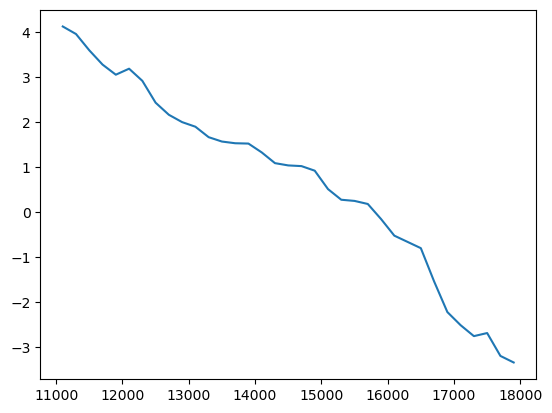

In [25]:
weighted_avg_curves_0 = [curves[0] for curves in all_weighted_avg_curves]
weighted_avg_curves_0_mean=np.mean(weighted_avg_curves_0,axis=0)
age=ds_sat['age'].values    

time_series=np.array([age,weighted_avg_curves_0_mean]).T
# crop the time_series for age <=18000
time_series_crop=time_series[time_series[:,0]<=18000]
# plot the time_series_crop
plt.plot(time_series_crop[:,0],time_series_crop[:,1])
# fit a linear regression model to the time_series_crop and give the slope and p value
from scipy import stats
slope, intercept, r_value, p_value, std_err = stats.linregress(time_series_crop[:,0],time_series_crop[:,1])
print('slope:',slope*-1000,'°C/kyr')
print('p_value:',p_value)

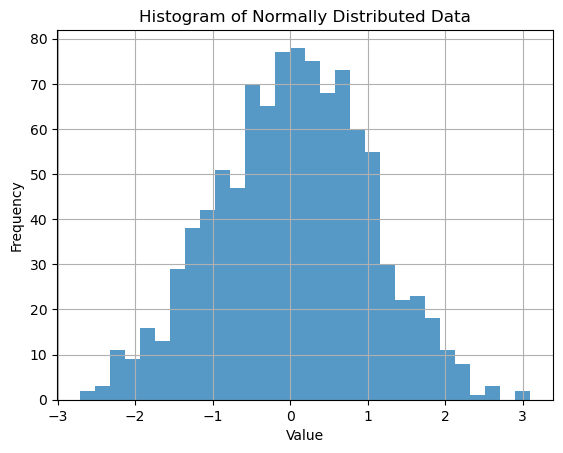

Counts per bin: [ 2.  3. 11.  9. 16. 13. 29. 38. 42. 51. 47. 70. 65. 77. 78. 75. 68. 73.
 60. 55. 30. 22. 23. 18. 11.  8.  1.  3.  0.  2.]
Bin edges: [-2.71859805e+00 -2.52460363e+00 -2.33060921e+00 -2.13661480e+00
 -1.94262038e+00 -1.74862596e+00 -1.55463154e+00 -1.36063712e+00
 -1.16664270e+00 -9.72648283e-01 -7.78653864e-01 -5.84659446e-01
 -3.90665027e-01 -1.96670608e-01 -2.67618936e-03  1.91318229e-01
  3.85312648e-01  5.79307067e-01  7.73301486e-01  9.67295904e-01
  1.16129032e+00  1.35528474e+00  1.54927916e+00  1.74327358e+00
  1.93726800e+00  2.13126242e+00  2.32525684e+00  2.51925125e+00
  2.71324567e+00  2.90724009e+00  3.10123451e+00]
Patches: <BarContainer object of 30 artists>


In [35]:
import numpy as np
import matplotlib.pyplot as plt

# Example data
data = np.random.normal(loc=0, scale=1, size=1000)

# Plot histogram and get the outputs
counts, bin_edges, patches = plt.hist(data, bins=30, alpha=0.75)

plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Histogram of Normally Distributed Data')
plt.grid(True)
plt.show()

# Print the histogram data
print("Counts per bin:", counts)
print("Bin edges:", bin_edges)
# print("Patches:", patches)
